In [1]:
%cd ~/hdstats/notebooks

/home/251/dxr251/hdstats/notebooks


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy as sp

from mpl_toolkits.mplot3d import axes3d

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
%config InlineBackend.figure_format = 'svg'

np.set_printoptions(precision=4, suppress=True, linewidth=120)
plt.style.use('./hdstats.mplstyle')

In [4]:
containers = pd.read_table('../data/container.txt')
bottles = pd.read_table('../data/bottle.txt')
s2ts = pd.read_table('../data/s2ts.txt', index_col=0, sep=' ', header=None)

In [5]:
%cd ~/hdstats

/home/251/dxr251/hdstats


In [6]:
from hdstats import MultivariateNormal, MarchenkoPastur, Wishart, ChiSquared, nangeomedian

In [7]:
#plt.rcParams

## TODO
 - Challenges in high-dimensional
 - Generalised Variance

## Multivariate data

### Containers dataset

In [8]:
df = containers
dimnames = df.columns.tolist()
print(dimnames)

['gp', 'Ti', 'Al', 'Fe', 'Mn', 'Mg', 'Ca', 'Ba', 'Sr', 'Zr']


In [9]:
X = df.values

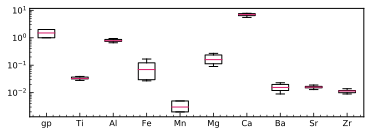

In [10]:
plt.figure(figsize=(6,2))
ax = plt.gca()
plt.boxplot(X)
ax.set_yscale('log')
ax.set_xticklabels(dimnames);

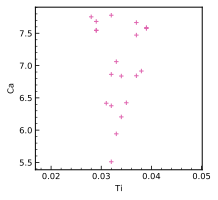

In [11]:
plt.figure(figsize=(3,3))
plt.scatter(X[:,1], X[:,6], marker='+', s=20);
plt.xlabel(dimnames[1])
plt.ylabel(dimnames[6]);

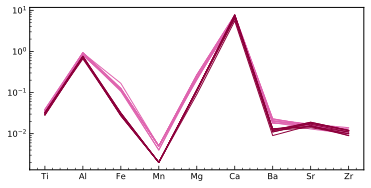

In [12]:
X = df[df.gp == 1].drop('gp', 1).values
Y = df[df.gp == 2].drop('gp', 1).values

plt.figure(figsize=(6,3))
ax = plt.gca()
styler = plt.rcParams['axes.prop_cycle'].by_key()['color']
for ds, style in zip([X,Y], styler[::2]):
    for xx in ds:
        ax.plot(xx, color=style)
ax.set_xticklabels(range(X.shape[1]))
ax.set_xticklabels(dimnames)
ax.set_yscale('log');

### Bottle dataset

In [13]:
df = bottles
dimnames = df.columns.tolist()
print(dimnames)

['Number', 'Mn', 'Ba', 'Sr', 'Zr', 'Ti']


In [14]:
X = df.values

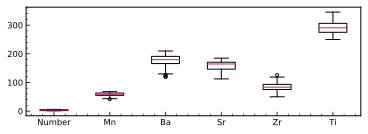

In [15]:
plt.figure(figsize=(6,2))
ax = plt.gca()
plt.boxplot(X)
ax.set_xticklabels(dimnames);

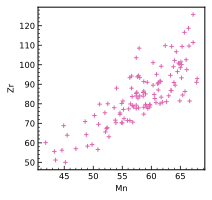

In [16]:
plt.figure(figsize=(3,3))
plt.scatter(X[:,1], X[:,4], marker='+', s=20);
plt.xlabel(dimnames[1])
plt.ylabel(dimnames[4]);

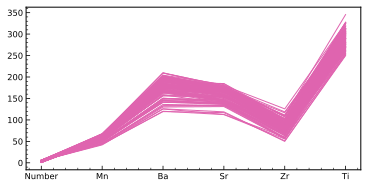

In [17]:
plt.figure(figsize=(6,3))
ax = plt.gca()
style = plt.rcParams['axes.prop_cycle'].by_key()['color'][0]
for xx in X:
    ax.plot(xx, color=style)
ax.set_xticks(range(6))
ax.set_xticklabels(dimnames);

### Sentinel-2 time series

In [18]:
dimnames = list(s2ts.index)
X = s2ts.values

In [19]:
gX=X[:,np.isfinite(X).all(axis=0)]

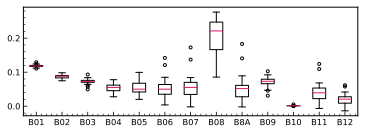

In [20]:
plt.figure(figsize=(6,2))
ax = plt.gca()
plt.boxplot(gX.T)
ax.set_xticklabels(dimnames);

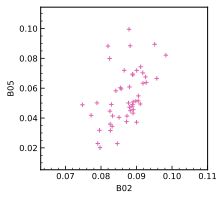

In [21]:
plt.figure(figsize=(3,3))
plt.scatter(gX[1,:], gX[4,:], marker='+', s=20);
plt.xlabel(dimnames[1])
plt.ylabel(dimnames[4]);

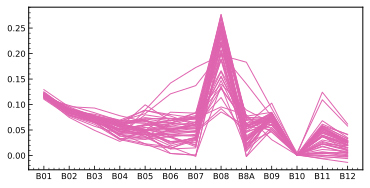

In [22]:
plt.figure(figsize=(6,3))
ax = plt.gca()
style = plt.rcParams['axes.prop_cycle'].by_key()['color'][0]
for xx in X.T:
    ax.plot(xx, color=style)
ax.set_xticks(range(X.shape[0]))
ax.set_xticklabels(dimnames);

## Statistics

In [23]:
dimnames = list(s2ts.index)
X = s2ts.values
n =20

In [24]:
gX=X[:,np.isfinite(X).all(axis=0)]

In [25]:
mu = np.nanmean(gX[:,:n], axis=1)

In [26]:
mm = nangeomedian(X[:,:n], axis=1)

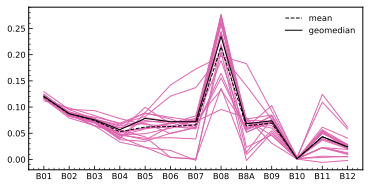

In [27]:
plt.figure(figsize=(6,3))
ax = plt.gca()
style = plt.rcParams['axes.prop_cycle'].by_key()['color']
for xx in gX[:,:n].T:
    ax.plot(xx, color=style[0])
ax.plot(mu, color='k', linestyle='--', label='mean')
ax.plot(mm, color='k', label='geomedian')
ax.set_xticks(range(X.shape[0]))
ax.set_xticklabels(dimnames);
plt.legend()

In [28]:
S = np.cov(gX)
print(S)

[[ 0.      0.      0.      0.      0.      0.      0.     -0.      0.     -0.      0.      0.      0.    ]
 [ 0.      0.      0.      0.0001  0.      0.      0.     -0.0001  0.      0.      0.      0.0001  0.    ]
 [ 0.      0.      0.      0.0001  0.0001  0.      0.      0.0001  0.      0.      0.      0.0001  0.    ]
 [ 0.      0.0001  0.0001  0.0001  0.0001  0.0001  0.0001 -0.0002  0.0001  0.0001  0.      0.0002  0.0001]
 [ 0.      0.      0.0001  0.0001  0.0003  0.0004  0.0004 -0.0001  0.0004  0.      0.      0.0003  0.0002]
 [ 0.      0.      0.      0.0001  0.0004  0.0007  0.0008 -0.0001  0.0008  0.      0.      0.0005  0.0003]
 [ 0.      0.      0.      0.0001  0.0004  0.0008  0.001  -0.0001  0.001   0.0001  0.      0.0006  0.0003]
 [-0.     -0.0001  0.0001 -0.0002 -0.0001 -0.0001 -0.0001  0.0028 -0.0002  0.0002 -0.     -0.0004 -0.0002]
 [ 0.      0.      0.      0.0001  0.0004  0.0008  0.001  -0.0002  0.0011  0.      0.      0.0006  0.0003]
 [-0.      0.      0.      0.0001  0.

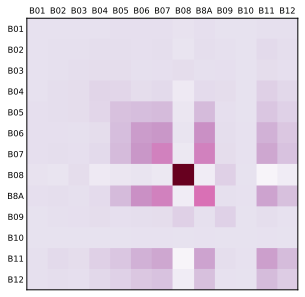

In [29]:
plt.figure(figsize=(5,5))
plt.imshow(S)
ax = plt.gca()
ax.set_xticks(range(X.shape[0]))
ax.set_xticklabels(dimnames)
ax.set_yticks(range(X.shape[0]))
ax.set_yticklabels(dimnames);
plt.tick_params(axis='both', which='both', length=0, labelbottom=False, labeltop=True, labelleft=True)

In [30]:
R = np.corrcoef(gX)
print(R)

[[ 1.      0.4125  0.3173  0.37    0.6025  0.3421  0.3596 -0.0544  0.3483 -0.0359  0.4682  0.3017  0.4256]
 [ 0.4125  1.      0.798   0.9142  0.4839  0.2438  0.3073 -0.2041  0.2688  0.3033  0.3511  0.6684  0.6745]
 [ 0.3173  0.798   1.      0.7531  0.4342  0.1503  0.1802  0.1732  0.118   0.3772  0.1999  0.3402  0.3103]
 [ 0.37    0.9142  0.7531  1.      0.541   0.1847  0.2249 -0.2649  0.1708  0.3567  0.2532  0.6079  0.6129]
 [ 0.6025  0.4839  0.4342  0.541   1.      0.7266  0.6958 -0.0905  0.6441  0.1292  0.2848  0.5938  0.6159]
 [ 0.3421  0.2438  0.1503  0.1847  0.7266  1.      0.9391 -0.0362  0.9372  0.1188  0.4051  0.7062  0.6676]
 [ 0.3596  0.3073  0.1802  0.2249  0.6958  0.9391  1.     -0.079   0.9347  0.1607  0.4509  0.7371  0.6733]
 [-0.0544 -0.2041  0.1732 -0.2649 -0.0905 -0.0362 -0.079   1.     -0.1274  0.2661 -0.0284 -0.2739 -0.2801]
 [ 0.3483  0.2688  0.118   0.1708  0.6441  0.9372  0.9347 -0.1274  1.      0.0631  0.4777  0.7261  0.6753]
 [-0.0359  0.3033  0.3772  0.3567  0.

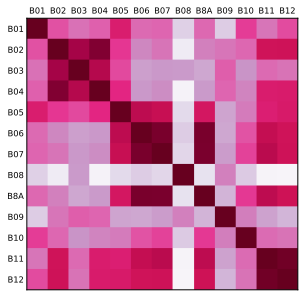

In [31]:
plt.figure(figsize=(5,5))
plt.imshow(R)
ax = plt.gca()
ax.set_xticks(range(X.shape[0]))
ax.set_xticklabels(dimnames)
ax.set_yticks(range(X.shape[0]))
ax.set_yticklabels(dimnames);
plt.tick_params(axis='both', which='both', length=0, labelbottom=False, labeltop=True, labelleft=True)

In [32]:
GV = np.linalg.det(np.cov(gX))
print(GV)

3.997992977180856e-58


In [33]:
logGV = np.log(GV)
print(logGV)

-132.16414291416106


## Multivariate normals

In [34]:
mu = np.array([0,0])
Sigma = np.eye(2)
mn = MultivariateNormal(mean=mu, cov=Sigma)

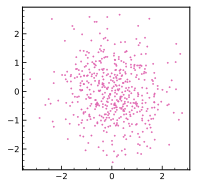

In [35]:
X = mn.rvs(500).T

plt.figure(figsize=(3,3))
plt.scatter(X[0,:], X[1,:], s=2);

<a list of 10 text.Text objects>

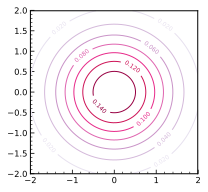

In [36]:
x, y = np.mgrid[-2:2:.01, -2:2:.01]
pos = np.dstack((x, y))
z = mn.pdf(pos)

fig = plt.figure(figsize=(3,3))
cs = plt.contour(x, y, z);
plt.clabel(cs, inline=1, fontsize=6)

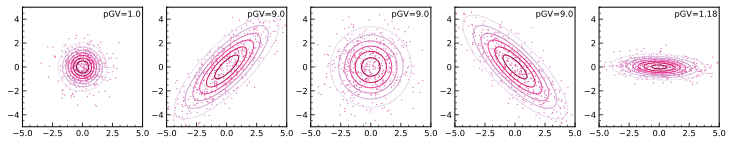

In [37]:
mu = np.array([0,0])
Sigmas = [
    np.eye(2),
    np.array([[5,4],[4,5]]),
    np.array([[3,0],[0,3]]),
    np.array([[5,-4],[-4,5]]),
    np.array([[4,-0.15],[-0.15,0.3]])
]

fig, axes = plt.subplots(1, len(Sigmas), figsize=(2.5*len(Sigmas), 2.2))

for i, Sigma in enumerate(Sigmas):
    mn = MultivariateNormal(mean=mu, cov=Sigma)
    x, y = np.mgrid[-5:5:.02, -5:5:.02]
    pos = np.dstack((x, y))
    z = mn.pdf(pos)
    X = mn.rvs(500).T
    GV = np.linalg.det(Sigma)
    axes[i].contour(x, y, z)
    axes[i].scatter(X[0,:], X[1,:])
    axes[i].set_xlim((-5,5))
    axes[i].set_ylim((-5,5))
    axes[i].text(4.85, 4.2, f'pGV={GV:.3}', horizontalalignment='right', size='small')

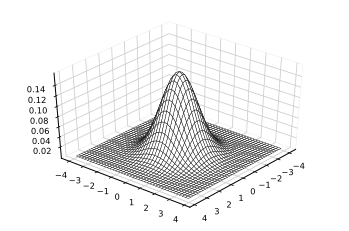

In [38]:
X = np.arange(-4, 4, 0.2)
Y = np.arange(-4, 4, 0.2)
X, Y = np.meshgrid(X, Y)

pos = np.empty(X.shape + (2,))
pos[:, :, 0] = X; pos[:, :, 1] = Y

mu = np.array([0,0])
Sigma = np.eye(2)
mn = MultivariateNormal(mean=mu, cov=Sigma)
Z = mn.pdf(pos)

fig = plt.figure(figsize=(6,4))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, color='white', shade=False)
#ax.plot_wireframe(X, Y, Z)

ax.grid(True)
ax.xaxis.pane.set_edgecolor(plt.rcParams['grid.color'])
ax.yaxis.pane.set_edgecolor(plt.rcParams['grid.color'])
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.view_init(elev=40, azim=40)
ax.dist=11

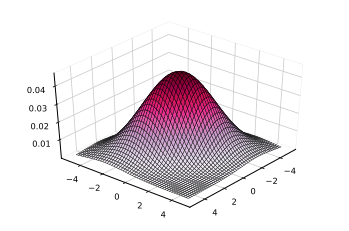

In [39]:
X = np.arange(-5, 5, 0.2)
Y = np.arange(-5, 5, 0.2)
X, Y = np.meshgrid(X, Y)

pos = np.empty(X.shape + (2,))
pos[:, :, 0] = X; pos[:, :, 1] = Y

mu = np.array([0,0])
Sigma = np.array([[4,-2],[-2,4]])
mn = MultivariateNormal(mean=mu, cov=Sigma)
Z = mn.pdf(pos)

fig = plt.figure(figsize=(6,4))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap=plt.rcParams['image.cmap'])

ax.grid(True)
ax.xaxis.pane.set_edgecolor(plt.rcParams['grid.color'])
ax.yaxis.pane.set_edgecolor(plt.rcParams['grid.color'])
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.view_init(elev=40, azim=40)
ax.dist=11

## Sample covariances

In [40]:
n, p = 500, 2

In [41]:
mu = np.zeros(p)
Sigma = np.eye(p)
mn = MultivariateNormal(mean=mu, cov=Sigma)

In [42]:
X = mn.rvs(500).T

In [43]:
X.shape

(2, 500)

The (population) covariance is $\Sigma$.

In [44]:
Sigma

array([[1., 0.],
       [0., 1.]])

We estimate the sample covariance from the data.

In [45]:
np.cov(X)

array([[1.0213, 0.0625],
       [0.0625, 0.9702]])

Another way to estimate the sample covariance.

In [46]:
np.matmul(X,X.T)/n

array([[1.0248, 0.0618],
       [0.0618, 0.9684]])

Generate the sample correlation matrix $R_{ij} = \frac{ C_{ij} } { \sqrt{ C_{ii} * C_{jj} } }$

In [47]:
np.corrcoef(X)

array([[1.    , 0.0628],
       [0.0628, 1.    ]])

## Wishart random matrices

### Joint distribution of eigenvalues

In [48]:
Sigma = np.array([[1,1/3],[1/3,1]])
print(Sigma)

n = 10

[[1.     0.3333]
 [0.3333 1.    ]]


In [49]:
wd = Wishart(df=n, scale=Sigma)

X = wd.rvs(10000)
Ls = np.stack([np.linalg.eig(x)[0] for x in X], axis=-1)

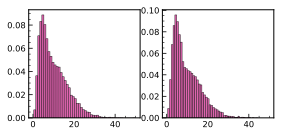

In [50]:
fig, axes = plt.subplots(1, Ls.shape[0], figsize=(2.2*Ls.shape[0],2), sharex=True)

for i in range(Ls.shape[0]):
    axes[i].hist(Ls[i], 50, density=True)

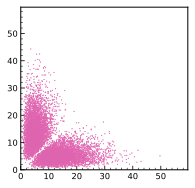

In [51]:
plt.figure(figsize=(3,3))
plt.scatter(Ls[0], Ls[1])
xmax = 1.2*np.max(Ls)
plt.xlim((0,xmax))
plt.ylim((0,xmax));

In [52]:
from statsmodels.nonparametric.kernel_density import KDEMultivariate

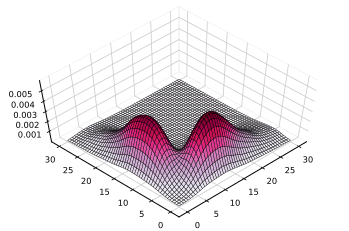

In [53]:
xmax = 30

x = np.linspace(0, xmax)
y = np.linspace(0, xmax)
X, Y = np.meshgrid(x, y)

pos = np.empty(X.shape + (2,))
pos[:, :, 0] = X; pos[:, :, 1] = Y

kde = KDEMultivariate(data=[Ls[0],Ls[1]], var_type='cc')
Z = kde.pdf(pos.reshape((-1,2))).reshape(X.shape)

fig = plt.figure(figsize=(6,4))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap=plt.rcParams['image.cmap'])

ax.grid(True)
ax.xaxis.pane.set_edgecolor(plt.rcParams['grid.color'])
ax.yaxis.pane.set_edgecolor(plt.rcParams['grid.color'])
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.view_init(elev=60, azim=-135)
ax.dist=10

## Diagonal elements of a Wishart random matrix

In [54]:
Sigma = np.array([[1,1/3],[1/3,1]])
print(Sigma)

n = 10

[[1.     0.3333]
 [0.3333 1.    ]]


In [55]:
wd = Wishart(df=n, scale=Sigma)

X = wd.rvs(10000)
Ds = np.stack([np.diag(x) for x in X], axis=-1) # diagonals!

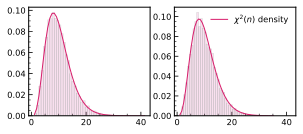

In [56]:
fig, axes = plt.subplots(1, Ds.shape[0], figsize=(2.4*Ds.shape[0],2), sharex=True)

for i in range(Ls.shape[0]):
    _, bins, _ = axes[i].hist(Ds[i], 50, density=True, alpha=0.2)
    cs = ChiSquared(df=n)
    axes[i].plot(bins, cs.pdf(bins), label='$\chi^2(n)$ density')
plt.legend()

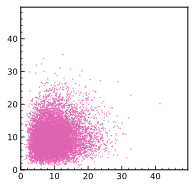

In [57]:
plt.figure(figsize=(3,3))
plt.scatter(Ds[0], Ds[1])
xmax = 1.2*np.max(Ds)
plt.xlim((0,xmax))
plt.ylim((0,xmax));

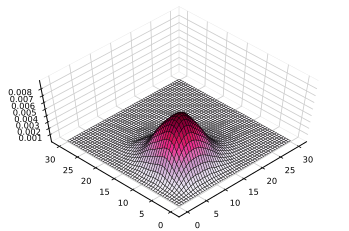

In [58]:
xmax = 30

x = np.linspace(0, xmax)
y = np.linspace(0, xmax)
X, Y = np.meshgrid(x, y)

pos = np.empty(X.shape + (2,))
pos[:, :, 0] = X; pos[:, :, 1] = Y

kde = KDEMultivariate(data=[Ds[0], Ds[1]], var_type='cc')
Z = kde.pdf(pos.reshape((-1,2))).reshape(X.shape)

fig = plt.figure(figsize=(6,4))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap=plt.rcParams['image.cmap'])

ax.grid(True)
ax.xaxis.pane.set_edgecolor(plt.rcParams['grid.color'])
ax.yaxis.pane.set_edgecolor(plt.rcParams['grid.color'])
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.view_init(elev=60, azim=-135)
ax.dist=10

### Cholesky decomposition

In [59]:
Sigma = np.eye(4)
print(Sigma)

n = 10

[[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]


In [60]:
wd = Wishart(df=n, scale=Sigma)

X = wd.rvs(10000)
Cs = np.stack([np.diag(np.linalg.cholesky(x))**2 for x in X], axis=-1)

In [61]:
Cs.shape

(4, 10000)

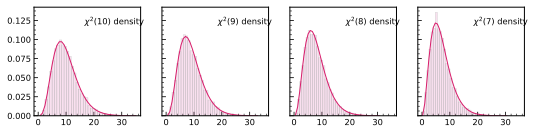

In [62]:
fig, axes = plt.subplots(1, Cs.shape[0], figsize=(2.2*Cs.shape[0],2), sharex=True, sharey=True)

for i in range(Cs.shape[0]):
    _, bins, _ = axes[i].hist(Cs[i], 40, density=True, alpha=0.2)
    cs = ChiSquared(df=n-i)
    axes[i].plot(bins, cs.pdf(bins))
    axes[i].text(bins[-2], 0.12, f'$\chi^2({n-i})$ density', horizontalalignment='right', size='small')

We see the components are uncorrelated.

In [63]:
np.corrcoef(Cs[0], Cs[1])

array([[1.    , 0.0077],
       [0.0077, 1.    ]])

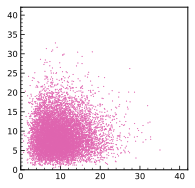

In [64]:
plt.figure(figsize=(3,3))
plt.scatter(Cs[0], Cs[1])
xmax = 1.2*np.max(Cs)
plt.xlim((0,xmax))
plt.ylim((0,xmax));

## What happens when the data dimensionality becomes large?

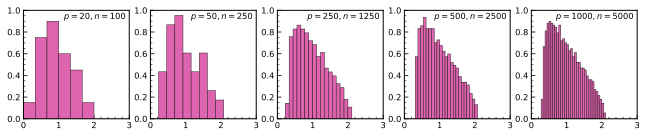

In [65]:
ps = [20, 50, 250, 500, 1000]
y = 0.2 # p/n ratio

fig, axes = plt.subplots(1, len(ps), figsize=(2.2*len(ps),2))

for i, p in enumerate(ps):
    n = int(p/y)
    mu = np.zeros(p)
    Sigma = np.eye(p)
    mn = MultivariateNormal(mean=mu, cov=Sigma)
    X = mn.rvs(n).T
    S = np.cov(X)
    Ls = np.linalg.eigvalsh(S)

    axes[i].hist(Ls, 'sqrt', range=(0, 3), density=True)
    axes[i].text(2.9, 0.92, f'$p={p}, n={n}$', horizontalalignment='right', size='small')

for i in range(len(ps)):
    axes[i].set_xlim((0, 3))
    axes[i].set_ylim((0, 1.))

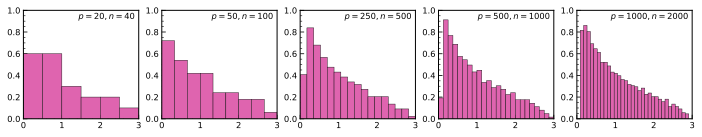

In [66]:
ps = [20, 50, 250, 500, 1000]
y = 0.5 # p/n ratio

fig, axes = plt.subplots(1, len(ps), figsize=(12,2))

for i, p in enumerate(ps):
    n = int(p/y)
    mu = np.zeros(p)
    Sigma = np.eye(p)
    mn = MultivariateNormal(mean=mu, cov=Sigma)
    X = mn.rvs(n).T
    S = np.cov(X)
    Ls = np.linalg.eigvalsh(S)

    axes[i].hist(Ls, 'sqrt', range=(0, 3), density=True)
    axes[i].text(2.9, 0.92, f'$p={p}, n={n}$', horizontalalignment='right', size='small')

for i in range(len(ps)):
    axes[i].set_xlim((0, 3))
    axes[i].set_ylim((0, 1.))

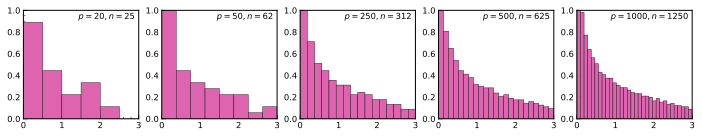

In [67]:
ps = [20, 50, 250, 500, 1000]
y = 0.8 # p/n ratio

fig, axes = plt.subplots(1, len(ps), figsize=(12,2))

for i, p in enumerate(ps):
    n = int(p/y)
    mu = np.zeros(p)
    Sigma = np.eye(p)
    mn = MultivariateNormal(mean=mu, cov=Sigma)
    X = mn.rvs(n).T
    S = np.cov(X)
    Ls = np.linalg.eigvalsh(S)

    axes[i].hist(Ls, 'sqrt', range=(0, 3), density=True)
    axes[i].text(2.9, 0.92, f'$p={p}, n={n}$', horizontalalignment='right', size='small')

for i in range(len(ps)):
    axes[i].set_xlim((0, 3))
    axes[i].set_ylim((0, 1.))

## Marchenko-Pastur density

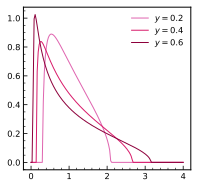

In [68]:
x = np.linspace(0, 4, 150)
for y in [0.2, 0.4, 0.6]:
    mp = MarchenkoPastur(y, 1.0)
    plt.plot(x, mp.pdf(x), label=f'$y={y}$')
plt.legend()

## Distribution of eigenvalues of Wishart random matrix

In [69]:
n = 10000
p = 1000
y = p/n

In [70]:
wd = Wishart(n, np.eye(p))

In [71]:
%time
X = wd.rvs().T
Ls = np.linalg.eigvalsh(X/n)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.48 µs


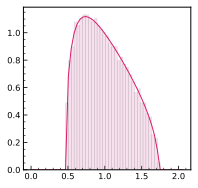

In [72]:
_, bins, patches = plt.hist(np.ravel(Ls), 'sqrt', range=(0, 1.2*np.max(Ls)), density=True, alpha=0.2)
mp = MarchenkoPastur(y, 1.0)
plt.plot(bins, mp.pdf(bins));

## Distribution of eigenvalues of sample covariance matrices

In [73]:
n = 1000
p = 50
y = p/n

print(f'y={y}')

y=0.05


In [74]:
mu = np.zeros(p)
Sigma = np.eye(p)
mn = MultivariateNormal(mean=mu, cov=Sigma)

In [75]:
X = mn.rvs(n).T

In [76]:
X.shape

(50, 1000)

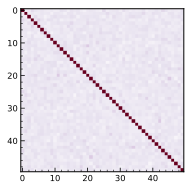

In [77]:
R = np.corrcoef(X)
plt.imshow(R)

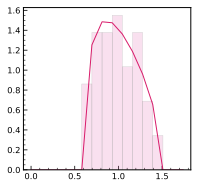

In [78]:
S = np.matmul(X,X.T)/n
Ls = np.linalg.eigvalsh(S)

_, bins, patches = plt.hist(np.ravel(Ls), 'sqrt', range=(0, 1.2*np.max(Ls)), density=True, alpha=0.2)
mp = MarchenkoPastur(y, 1.0)
plt.plot(bins, mp.pdf(bins));

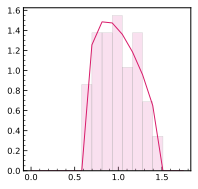

In [79]:
S = np.cov(X)
Ls = np.linalg.eigvalsh(S)

_, bins, patches = plt.hist(np.ravel(Ls), 'sqrt', range=(0, 1.2*np.max(Ls)), density=True, alpha=0.2)
mp = MarchenkoPastur(y, 1.0)
plt.plot(bins, mp.pdf(bins));

## Empirical spectral distribution

In [80]:
p, n = 50, 100
mu = np.zeros(p)
Sigma = np.eye(p)
mn = MultivariateNormal(mean=mu, cov=Sigma)

In [81]:
X = mn.rvs(n).T

In [82]:
S = np.cov(X)
Ls = np.linalg.eigvalsh(S)

It's pretty hard to draw the empirical spectral distribution $$F^{\mathbb{S}_n} (x) = \frac{1}{p} \sum_{i=1}^p \delta_{\lambda_k}(x).$$ One way is to think of this function as a plot where you have a horizontal line at every eigenvalue (of height $1/p$). Draw a horizontal line at every eigenvalue. Note that setting the height of this line to $1/p$ is tricky and can't be done with the `abline` function.


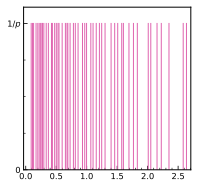

In [83]:
for ell in Ls:
    plt.axvline(x=ell, ymax=0.9)
plt.ylim((0,1/p))
plt.yticks([0, 0.9*1/p], ['0', '$1/p$']);

Remember in the lecture we didn't deal with the ESD $F^{\mathbb{S}_n}$ directly, but instead we considered $$F^{\mathbb{S}_n}({\varphi}) := \int \varphi(x) F^{\mathbb{S}_n}(dx),$$ for some choice of $\varphi$.

I gave two examples: $\varphi(x) = \log(x)$ for the generalised variance and $\varphi_z(x) = \frac{1}{x-z}$ for the Stieltjes transform (which depends on another variable $z$).


In [84]:
p, n = 200, 800
mu = np.zeros(p)
Sigma = np.eye(p)
mn = MultivariateNormal(mean=mu, cov=Sigma)
S = np.cov(mn.rvs(n).T)

In [85]:
Ls = np.linalg.eigvalsh(S)

In [86]:
GV = np.sum(np.log(Ls))/p
print(GV)

-0.136151256527704


Consider the test statistic
$$
\mathbb{T}_n = \frac{1}{p}\sum_{k=1}^p \lambda_k,
$$
which is the case $\varphi(x) = x$

In [87]:
N = 1000
p, n = 100, 400
Ts = np.empty(N)
for i in range(N):
    S = np.cov(mn.rvs(n).T)
    Ls = np.linalg.eigvalsh(S)
    Ts[i] = np.sum(Ls)/p

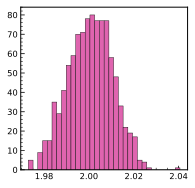

In [88]:
plt.hist(Ts, 'sqrt');

## Correlation between dimensions

We are going to look at the *generalised* Marcenko-Pastur distribution which is a description of the behaviour of the eigenvalues (of the sample covariance matrix) in the case where correlation is introduced between the entries of the $p$-dimensional vector observations. We will look at reproducing the results in the paper by Jing, Pan, Shao and Zhou (2010) titled "Nonparametric estimate of spectral density functions of sample covariance matrices: a first step" published in The Annals of Statistics.

The MP situation is very limited as entries of the observations are assumed to be independent with mean zero and variance 1. In other words, the sample covariance matrix is $\mathbb{S}_n = \frac{1}{n} {\mathbb{X} \mathbb{X}}^{*}$ where $\mathbb{X}$ is a $p \times n$ data matrix. Here, $\mathbb{S}_n$ is a matrix of size $p\times p$.

If $\mathbb{X} = (\mathbb{x}_1, \ldots, \mathbb{x}_n)$ is a $p \times n$ data matrix, we can introduce a correlation between $i$'th and $j$'th (where $1 \le i, j \le p$) component of each observation vector $\mathbb{x}_1, \ldots, \mathbb{x}_n$ by introducing a $p \times p$ nonrandom Hermitian nonnegative definite matrix $\mathbb{T}_n$ and then consider random matrices of the form
$$
\mathbb{A}_n = \frac{1}{n} \mathbb{T}_n^{1/2}{\mathbb{X}\mathbb{X}}^*\mathbb{T}_n^{1/2}.
$$



### Deterministic correlation

A simple deterministic case would be $\mathbb{T}_n = (\rho^{|i-j|})$ for $1 \le i,j \le p$ where $\rho$ is a constant. For example, when $n=3$ we get
$$
	\mathbb{T}_n
	= \begin{pmatrix}
		1 & \rho^{|1-2|} & \rho^{|1-3|}\\
		\rho^{|2-1|} & 1 & \rho^{|2-3|}\\
		\rho^{|3-1|} & \rho^{|3-2|} & 1\\
	  \end{pmatrix}
	= \begin{pmatrix}
		1 & \rho& \rho^{2}\\
		\rho & 1 & \rho\\
		\rho^{2} & \rho & 1\\
	\end{pmatrix}.
$$

In [89]:
def pcor(rho, p):
    Tn = np.empty((p,p))
    for i in range(p):
        for j in range(p):
            Tn[i,j] = rho**abs(i-j)
    return Tn

In [90]:
rho=0.5
p, n = 100, 1000
y = p/n
print(f'y={y}')

mu = np.zeros(p)
Sigma = pcor(rho, p)
mn = MultivariateNormal(mean=mu, cov=Sigma)

y=0.1


In [91]:
Sigma

array([[1.  , 0.5 , 0.25, ..., 0.  , 0.  , 0.  ],
       [0.5 , 1.  , 0.5 , ..., 0.  , 0.  , 0.  ],
       [0.25, 0.5 , 1.  , ..., 0.  , 0.  , 0.  ],
       ...,
       [0.  , 0.  , 0.  , ..., 1.  , 0.5 , 0.25],
       [0.  , 0.  , 0.  , ..., 0.5 , 1.  , 0.5 ],
       [0.  , 0.  , 0.  , ..., 0.25, 0.5 , 1.  ]])

In [92]:
X = mn.rvs(n).T

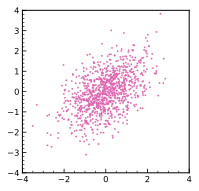

In [93]:
plt.scatter(X[1,:], X[2,:], s=2)
plt.xlim((-4,4))
plt.ylim((-4,4));

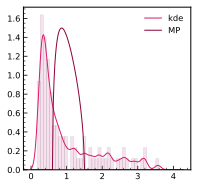

In [94]:
S = np.cov(X)
Ls = np.linalg.eigvalsh(S)

xmin, xmax = (0, 1.2*np.max(Ls))
_, bins, patches = plt.hist(np.ravel(Ls), 50, range=(xmin, xmax), density=True, alpha=0.2)

kde = sp.stats.gaussian_kde(Ls, 0.1)
x = np.linspace(xmin, xmax, 200)
plt.plot(x, kde.evaluate(x), label='kde');
plt.plot(x, mp.pdf(x), label='MP');
plt.legend()

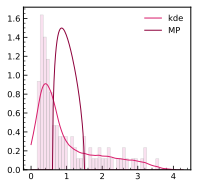

In [95]:
S = np.cov(X)
Ls = np.linalg.eigvalsh(S)

xmin, xmax = (0, 1.2*np.max(Ls))
_, bins, patches = plt.hist(np.ravel(Ls), 50, range=(xmin, xmax), density=True, alpha=0.2)

from statsmodels.nonparametric.kde import KDEUnivariate

kde = KDEUnivariate(Ls)
kde.fit('tri', 0.5, fft=False)

xx = np.linspace(xmin, xmax, 200)
plt.plot(x, [kde.evaluate(x) for x in xx], label='kde');
plt.plot(x, mp.pdf(x), label='MP');
plt.legend()

## CLT for Linear Spectral Statistics

In [96]:
mp.mean()

0.6027870741962879

## PCM

In [97]:
import joblib
ds = joblib.load('data/6mp63x30.pkl.xz')

In [98]:
times, data = ds

In [99]:
import pcm

In [100]:
gm = pcm.gmpcm(data)

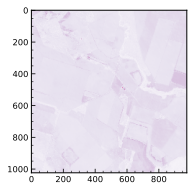

In [101]:
plt.imshow(gm[:,:,1])

0 472.4525494384766 1044.0274951171875
1 606.3169250488281 1344.5513671875003
2 666.9754772949218 1716.4913500976563
3 997.0849255371093 1962.3317919921876
4 1306.7994995117188 2298.7816601562504
5 1415.2074902343752 2521.719711914063
6 1513.597236328125 2748.4239892578125
7 1592.071044921875 2852.36671875
8 1585.6698413085937 3634.579682617189


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9 1028.0256420898438 3071.44345703125


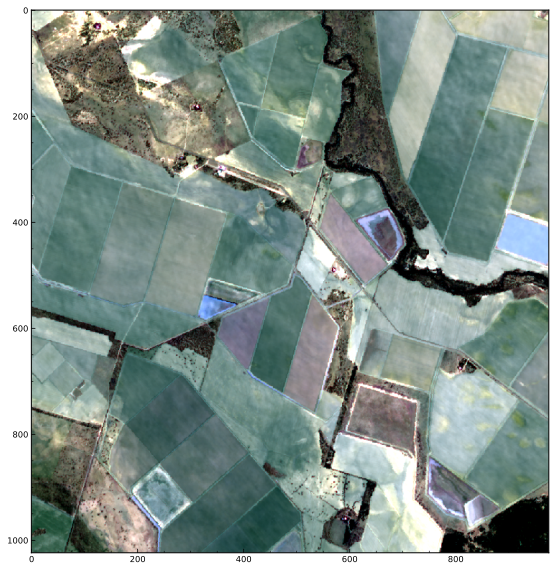

In [102]:
img = gm.copy()
for i in range(img.shape[2]):
    dd=img[:,:,i]
    pl, pu = np.percentile(dd[np.isfinite(dd)], (2,98))
    print(i, pl, pu)
    dd[dd<pl], dd[dd>pu] = pl, pu
    dd -= pl
    dd /= (pu - pl)

plt.figure(figsize=(10,10))
plt.imshow(img[:,:,[3,2,1]])

## DTW

TODO:
    - Time series data

In [103]:
def interpolate_nans(X):
    """Overwrite NaNs with column value interpolations."""
    for j in range(X.shape[1]):
        mask_j = np.isnan(X[:,j])
        X[mask_j,j] = np.interp(np.flatnonzero(mask_j), np.flatnonzero(~mask_j), X[~mask_j,j])
    return X

In [104]:
import joblib
ds = joblib.load('data/6mp63x30.pkl.xz')

In [105]:
from sdtw import SoftDTW
from sdtw.distance import SquaredEuclidean

In [106]:
import pcm

In [107]:
times, data = ds

In [108]:
data[data > 10000] = 10000.
data[data < 1] = 0
data /= 10000.

/g/data/v10/public/modules/dea-env/20181015/lib/python3.6/site-packages/ipykernel/__main__.py:1: RuntimeWarning: invalid value encountered in greater
  if __name__ == '__main__':
/g/data/v10/public/modules/dea-env/20181015/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in less
  from ipykernel import kernelapp as app


In [109]:
gm = pcm.gmpcm(data)

0 0.047254440486431126 0.10440132156014442
1 0.06064114801585674 0.13445334374904636
2 0.06670875757932662 0.1716422715783119
3 0.09972477942705155 0.19622100830078126
4 0.13070738613605498 0.22987679898738866
5 0.1415599900484085 0.2521829169988632
6 0.15140483051538467 0.27483143329620363
7 0.1592454552650452 0.2852317416667938
8 0.1585540071129799 0.363432133793831
9 0.10279659152030945 0.30712337553501134


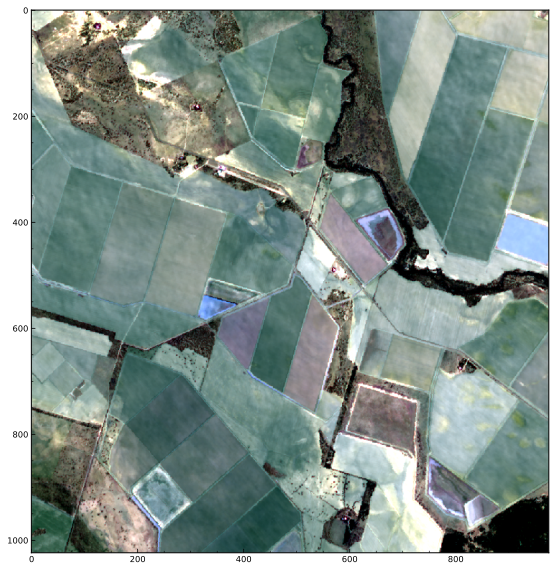

In [110]:
img = gm.copy()
for i in range(img.shape[2]):
    dd=img[:,:,i]
    pl, pu = np.percentile(dd[np.isfinite(dd)], (2,98))
    print(i, pl, pu)
    dd[dd<pl], dd[dd>pu] = pl, pu
    dd -= pl
    dd /= (pu - pl)
img = img[:,:,[3,2,1]]
    
plt.figure(figsize=(10,10))
plt.imshow(img)

In [111]:
from skimage.segmentation import slic, quickshift, mark_boundaries, chan_vese

In [112]:
segmask = quickshift(img.astype(np.double), ratio=0.5,max_dist=500, convert2lab=False)

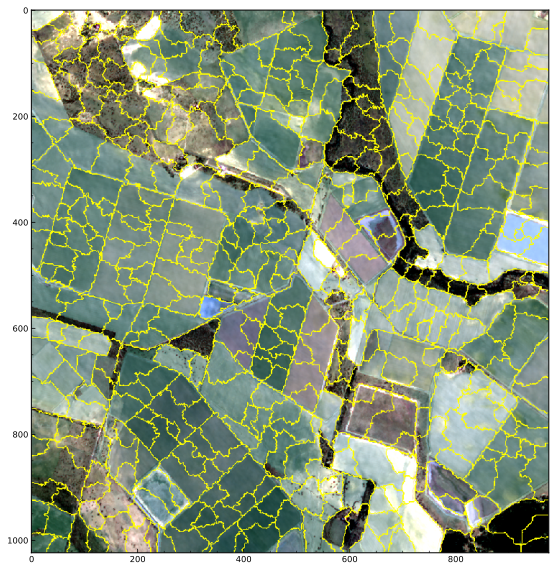

In [113]:
plt.figure(figsize=(10,10))
plt.imshow(mark_boundaries(img, segmask))

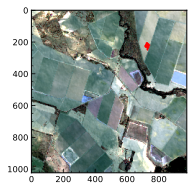

In [114]:
mimg = img.copy()
mimg[segmask == 100] = np.array([1,0,0])
plt.imshow(mimg)

In [115]:
X = data[400,300,:,:].T.copy()
Y = data[400,305,:,:].T.copy()

In [116]:
X = interpolate_nans(X)
Y = interpolate_nans(Y)

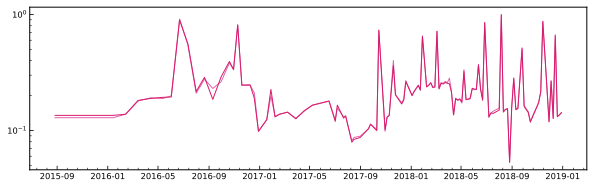

In [117]:
plt.figure(figsize=(10,3))
plt.plot(times, X[:,4]);
plt.plot(times, Y[:,4]);
plt.yscale('log')

In [118]:
D = SquaredEuclidean(X.T, Y.T)
sdtw = SoftDTW(D, gamma=0.00001)
value = sdtw.compute()

In [119]:
value

0.17246404410465654

In [120]:
from sdtw.barycenter import sdtw_barycenter

In [121]:
X = data[segmask == 100, :, :]

In [122]:
for i in range(X.shape[0]):
    X[i] = interpolate_nans(X[i].T).T

In [123]:
X.shape

(1072, 10, 111)

In [124]:
ndvi = (X[:,3,:]-X[:,2,:])/(X[:,3,:]+X[:,2,:])

In [125]:
ndvi[:,np.newaxis,:].shape

(1072, 1, 111)

In [126]:
barycenter_init = sum(ndvi) / len(ndvi)

In [127]:
barycenter_init[:,np.newaxis].shape

(111, 1)

In [129]:
#Z = sdtw_barycenter(ndvi[:,np.newaxis,:], barycenter_init[:,np.newaxis], gamma=0.1)

In [ ]:
Z.shape

In [ ]:
plt.figure(figsize=(10,3))
plt.plot(times, Z.T)
plt.yscale('log')

In [ ]:
X = data[:100,:100,:,:].copy()

In [ ]:
for i in range(X.shape[0]):
    for j in range(X.shape[1]):
        X[i,j,:,:] = interpolate_nans(X[i,j,:,:].T).T

In [ ]:
origshape = X.shape
X = X.reshape((-1, X.shape[2], X.shape[3]))

In [ ]:
ndvi = (X[:,3,:]-X[:,2,:])/(X[:,3,:]+X[:,2,:])

In [ ]:
from scipy.cluster.hierarchy import fclusterdata

In [ ]:
def dtwdist(ts1, ts2):
    D = SquaredEuclidean(ts1.reshape(-1, 1), ts2.reshape(-1, 1))
    sdtw = SoftDTW(D, gamma=0.01)
    return sdtw.compute()

In [ ]:
clusters = fclusterdata(ndvi, 1.0, metric=dtwdist)

### Two-sample tests of mean

In [130]:
n1 = n2 = 50

In [131]:
p = 200

In [132]:
mu1 = np.zeros(p)

In [133]:
mu2 = mu1.copy()
mu2[:10] = 0.2

In [134]:
true_cov = np.power(0.4, np.absolute(np.subtract.outer(np.arange(p), np.arange(p))))

In [135]:
true_cov[:10,:10]

array([[1.    , 0.4   , 0.16  , 0.064 , 0.0256, 0.0102, 0.0041, 0.0016, 0.0007, 0.0003],
       [0.4   , 1.    , 0.4   , 0.16  , 0.064 , 0.0256, 0.0102, 0.0041, 0.0016, 0.0007],
       [0.16  , 0.4   , 1.    , 0.4   , 0.16  , 0.064 , 0.0256, 0.0102, 0.0041, 0.0016],
       [0.064 , 0.16  , 0.4   , 1.    , 0.4   , 0.16  , 0.064 , 0.0256, 0.0102, 0.0041],
       [0.0256, 0.064 , 0.16  , 0.4   , 1.    , 0.4   , 0.16  , 0.064 , 0.0256, 0.0102],
       [0.0102, 0.0256, 0.064 , 0.16  , 0.4   , 1.    , 0.4   , 0.16  , 0.064 , 0.0256],
       [0.0041, 0.0102, 0.0256, 0.064 , 0.16  , 0.4   , 1.    , 0.4   , 0.16  , 0.064 ],
       [0.0016, 0.0041, 0.0102, 0.0256, 0.064 , 0.16  , 0.4   , 1.    , 0.4   , 0.16  ],
       [0.0007, 0.0016, 0.0041, 0.0102, 0.0256, 0.064 , 0.16  , 0.4   , 1.    , 0.4   ],
       [0.0003, 0.0007, 0.0016, 0.0041, 0.0102, 0.0256, 0.064 , 0.16  , 0.4   , 1.    ]])

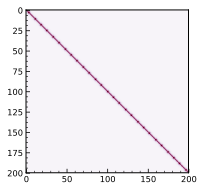

In [136]:
plt.imshow(true_cov)

In [137]:
sam1 = MultivariateNormal.rvs(mu1, cov=true_cov, size = n1).T
sam2 = MultivariateNormal.rvs(mu2, cov=true_cov, size = n2).T

In [ ]:
np.savetxt('/tmp/sample1.csv', sam1, delimiter=',')
np.savetxt('/tmp/sample2.csv', sam2, delimiter=',')

#### Hotelling T^2

In [39]:
def hotelling(x, y):
    nx = x.shape[0]
    ny = y.shape[0]
    px = x.shape[1]
    py = y.shape[1]
    p = px
    assert(nx + ny > px - 1)
    mx = np.mean(x, axis=0)
    my = np.mean(y, axis=0)
    sx = np.cov(x, rowvar=False)
    sy = np.cov(y, rowvar=False)
    sp = ((nx-1)*sx + (ny-1)*sy)/(nx + ny - 2) # pooled
    spi = la.inv(sp)
    T2 = np.dot(np.dot(mx-my, spi), mx - my) * nx * ny / (nx + ny)
    m = (nx + ny - p - 1)/(p * (nx + ny - 2))
    return {'statistic': T2, 'm': m, 'df': (p, nx + ny - p - 1), 'nx': nx, 'ny':ny, 'p':p}

def hotelling_t2_test(x, y):
    from scipy.stats import f as fisher_f
    s = hotelling(x, y)
    d1, d2 = s['df']
    dist = fisher_f(d1, d2, 0)
    pvalue = 1.0 - dist.cdf(s['m']*s['statistic'])
    print("Two-sample Hotelling test. T2 = {:04f}, df1={}, df2={}, p-value = {:04f}. Ha: true difference in mean vectors is not a zero vector".format(s['statistic'], s['df'][0], s['df'][1], pvalue))
    return pvalue

#### Bai and Sarandasa (1996)

In [ ]:
n1, n2 = sam1.shape[0], sam2.shape[0]

In [ ]:
tau = (n1*n2)/(n1+n2)
n = n1 + n2 - 2
p = sam1.shape[1]

In [ ]:
n

In [ ]:
# sum of square distance of means
sqdiff = np.sum(np.square(np.mean(sam1, axis=0) - np.mean(sam2, axis=0)))
print(sqdiff)

In [ ]:
S = ((n1 - 1) * np.cov(sam1, rowvar=False) + (n2-1) * np.cov(sam2, rowvar=False))/n

In [ ]:
trS = np.trace(S)

In [ ]:
print(trS)

In [ ]:
trS2 = n**2 / ((n+2) * (n-1)) * (np.sum(np.square(S)) - np.square(trS)/n)

In [ ]:
trS2

In [ ]:
test_stat = ((tau*sqdiff-trS)/np.sqrt(2*(n+1)/n * trS2))
print(test_stat)

In [ ]:
from scipy.stats import norm
pval = 1.0 - norm.cdf(test_stat)

In [ ]:
pval

#### Chen and Qin (2010)

##### Same covariance

In [ ]:
S = ((n1 - 1) * np.cov(sam1, rowvar=False) + (n2-1) * np.cov(sam2, rowvar=False))/n

In [ ]:
trS = np.trace(S)

In [ ]:
trS2 = n**2 / ((n+2) * (n-1)) * (np.sum(np.square(S)) - np.square(trS)/n)

In [ ]:
T1 = np.dot(sam1, sam1.T)

In [ ]:
T1.shape

In [ ]:
T2 = np.dot(sam2, sam2.T)

In [ ]:
P1 = (np.sum(T1) - np.trace(T1))/(n1*(n1-1))

In [ ]:
P2 = (np.sum(T2) - np.trace(T2))/(n2*(n2-1))

In [ ]:
P3 = -2 * np.sum(np.dot(sam1, sam2.T))/(n1*n2)

In [ ]:
T = P1 + P2 + P3

In [ ]:
test_stat = T/np.sqrt((2./ (n1*(n1 - 1)) + 2. / (n2*(n2 - 1)) + 4/(n1*n2))*trS2)

In [ ]:
test_stat

##### Different covariances

In [ ]:
n1 = sam1.shape[0]
n2 = sam2.shape[0]
p =  sam1.shape[1]

In [ ]:
T1 = np.dot(sam1, sam1.T)
T2 = np.dot(sam2, sam2.T)

In [ ]:
P1 = (np.sum(T1) - np.trace(T1))/(n1*(n1 - 1))
P2 = (np.sum(T2) - np.trace(T2))/(n2*(n2 - 1))
P3 = -2*np.sum(np.dot(sam1, sam2.T))/(n1*n2)
T = P1 + P2 + P3

In [ ]:
TrCov1 = 

### Two sample test of geometric median

#### Rublick and Somorcik

In [40]:
def pairdiff(X):
    n, p = X.shape
    D = np.empty((int(n*(n-1)/2), p))
    k = 0
    for i in range(n-1):
        for j in range(i+1, n):
            D[k,:] = X[i,:]-X[j,:]
            k = k + 1
    return D

In [41]:
def SSCov(X):
    D = pairdiff(X)
    Ds = D/la.norm(D, axis=1).reshape((-1,1))
    return np.einsum('ij,ik->jk', Ds, Ds) / (X.shape[0]*(X.shape[0]-1)/2)

In [42]:
def shape_det(a):
    return a/(la.det(a)**(1/a.shape[1]))

In [43]:
def duembgen_shape(X, maxiters=1000, init=None):
    n,p = X.shape
    if init is None:
        init = np.cov(X, rowvar=False)
    init = shape_det(init)
    it = 0
    V = init.copy()
    while it < maxiters:
        sqrtV = sla.sqrtm(V)
        V1 = sqrtV @ SSCov(X @ la.inv(sqrtV)) @ sqrtV
        V1 = shape_det(V1)
        if la.norm(V1-V) < 0.0001:
            break
        V = V1.copy()
        it = it + 1
    #print('iters: {}'.format(it))
    return V1

In [44]:
def U(x):
    return x/la.norm(x)

def P(x):
    nrm = la.norm(x)
    I = np.identity(len(x))
    return (I - np.outer(x, x)/(nrm**2))/nrm

In [45]:
from scipy.stats import chi2

def rs_test(XX, YY):
    X = np.vstack([XX, YY])
    n = np.array([XX.shape[0], YY.shape[0]])
    W = duembgen_shape(X)
    Wsqrt = sla.sqrtm(W)
    Y = X @ la.inv(Wsqrt)
    eta = []
    cns = np.cumsum(n)
    for j in range(len(n)):
        si, ei = cns[j] - n[j], cns[j]
        gm = np.array(hd.geomedian(Y[si:ei], axis=0))
        eta.append(Wsqrt @ gm)
    eta = np.stack(eta)
    Ygm = np.array(hd.geomedian(Y, axis=0))
    
    def U(x):
        return x/la.norm(x)

    def P(x):
        nrm = la.norm(x)
        I = np.identity(len(x))
        return (I - np.outer(x, x)/(nrm**2))/nrm
    
    D1 = np.mean(np.apply_along_axis(P, 1, Y-Ygm), axis=0)
    D2 = np.cov(np.apply_along_axis(U, 1, Y-Ygm), rowvar=False, bias=True)
    invB = la.inv(Wsqrt) @ D1 @ la.inv(D2) @ D1 @ la.inv(Wsqrt)
    A1 = n @ eta / np.sum(n)
    A2 = Wsqrt @ Ygm
    
    dist = chi2((n.shape[0]-1)*X.shape[1])
    loc = A2
    A = 0
    for j in range(n.shape[0]):
        A = A + n[j]*(eta[j]-loc).T @ invB @ (eta[j]-loc)
    pvalue = 1. - dist.cdf(A)
    print("Two-sample Rublik Somorcik test. A = {:04f}, p-value = {:04f}. Ha: true difference in median vectors is not a zero vector".format(A, pvalue))
    return pvalue